# GroundingDINO

**GroundingDINO** is one of the latest Transformers-based architectures.

## Key Features

- **Instance Segmentation:**
  - By adding a kernel and a mask feature generation head, RTMDet achieves instance segmentation with only around 10% additional parameters.
  - Achieves 44.6% mask AP at 180 FPS on COCO val set.

- **Rotated Object Detection:**
  - For rotated object detection, RTMDet extends the dimension of the box regression layer and employs a rotated box decoder.
  - Achieves 81.33% AP on DOTA v1.0 dataset.

## Experimental Results and Model Scaling

- RTMDet offers a range of model sizes for various application scenarios.
- Outperforms previous methods with a superior parameter-accuracy trade-off.
- RTMDet-tiny achieves 41.1% AP at 1020 FPS with only 4.8M parameters.

### Macro Architecture

- Decomposes the macro architecture into backbone, neck, and head.
- Utilizes CSP-blocks with large-kernel depth-wise convolutions for efficient feature extraction.
- Detection heads with shared convolution weights for classification and regression.

### Model Architecture

- Introduces 5x5 depth-wise convolutions for a larger effective receptive field.
- Achieves a balance between model width and depth to improve parallelization and maintain capacity.
- Shares parameters across detection heads for efficiency.

### Label Assignment Strategies

- Explores dynamic label assignment with soft labels, improving convergence speed and accuracy.

<em>Summary</em> - RTMDet stands out as a real-time object detection model with superior performance, demonstrating efficiency, accuracy, and versatility across different application scenarios.

**Source**: more details is given in [Arxiv](https://ar5iv.labs.arxiv.org/html/2212.07784)

# -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- --
## Training setup

### 1. GPU memory usage
Run this code lines to check CUDA and GPU memory availabilty


In [1]:
!nvidia-smi

Thu Nov 21 21:44:24 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA RTX A6000               Off |   00000000:19:00.0 Off |                  Off |
| 30%   45C    P8             26W /  300W |    1251MiB /  49140MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
# Check CUDA compiler
!nvcc -V

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Mon_Apr__3_17:16:06_PDT_2023
Cuda compilation tools, release 12.1, V12.1.105
Build cuda_12.1.r12.1/compiler.32688072_0


### <em>Optional</em>
If you'd like to use a base a pretrained RTMdet, you can uncomment the following line code

and change `load_from` variable in the config file [rtmdet_hrplanesv2.py](./mmlab_configs/rtmdet_hrplanesv2.py) from `None` to the path of the downloaded `.pth`

In [8]:
!mim install mmengine

Looking in links: https://download.openmmlab.com/mmcv/dist/cu117/torch2.0.0/index.html
  Using cached termcolor-2.4.0-py3-none-any.whl.metadata (6.1 kB)
Using cached termcolor-2.4.0-py3-none-any.whl (7.7 kB)


In [9]:
!mim download mmdet --config grounding_dino_swin-t_finetune_16xb2_1x_coco --dest mmlab_configs

processing grounding_dino_swin-t_finetune_16xb2_1x_coco...
downloading ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 695.3/695.3 MiB 6.2 MB/s eta 0:00:0000:0100:03
Successfully downloaded grounding_dino_swin-t_finetune_16xb2_1x_coco_20230921_152544-5f234b20.pth to /home/safouane/Downloads/FlightScope_Bench/mmlab_configs
Successfully dumped grounding_dino_swin-t_finetune_16xb2_1x_coco.py to /home/safouane/Downloads/FlightScope_Bench/mmlab_configs


### Start training

you can start training groundingDINO using this command line

In [1]:
!python train.py mmlab_configs/grounding_dino_hrplanesv2.py

/home/safouane/miniconda3/envs/openmmlab/lib/python3.8/site-packages/torchvision/datapoints/__init__.py:12: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. Please submit any feedback you may have in this issue: https://github.com/pytorch/vision/issues/6753, and you can also check out https://github.com/pytorch/vision/issues/7319 to learn more about the APIs that we suspect might involve future changes. You can silence this warning by calling torchvision.disable_beta_transforms_warning().
  warnings.warn(_BETA_TRANSFORMS_WARNING)
/home/safouane/miniconda3/envs/openmmlab/lib/python3.8/site-packages/torchvision/transforms/v2/__init__.py:54: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. Plea

### Wait until the training finishes
if the training takes too long you can use in the terminal the command:

 ```nohup python train.py mmlab_configs/rtmdet_hrplanesv2.py > rtmdet_hrplanesv2.log &```

### Inference
To run the inference, execute the following command

In [3]:
!python image_inference.py inference_test/unseen output_tensor/rtmdet/rtmdet_hrplanesv2.py --weights output_tensor/rtmdet/best.pth --out-dir inference_test/results/rtmdet_inference --pred-score-thr 0.3

Loads checkpoint by local backend from path: output_tensor/rtmdet/best.pth
01/11 14:09:43 - mmengine - WARNING - Failed to search registry with scope "mmdet" in the "function" registry tree. As a workaround, the current "function" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmdet" is a correct scope, or whether the registry is initialized.
01/11 14:09:43 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
/home/safouane/miniconda3/envs/openmmlab/lib/python3.8/site-packages/torch/funct━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━   
ional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be 
required to pass the indexing argument. (Triggered internally at 
/opt/conda/conda-bld/pytorch_1682343962757/work/aten/src/ATen/native/TensorShape
.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/home/safouane/.local/lib/python3.

### Let's plot the results

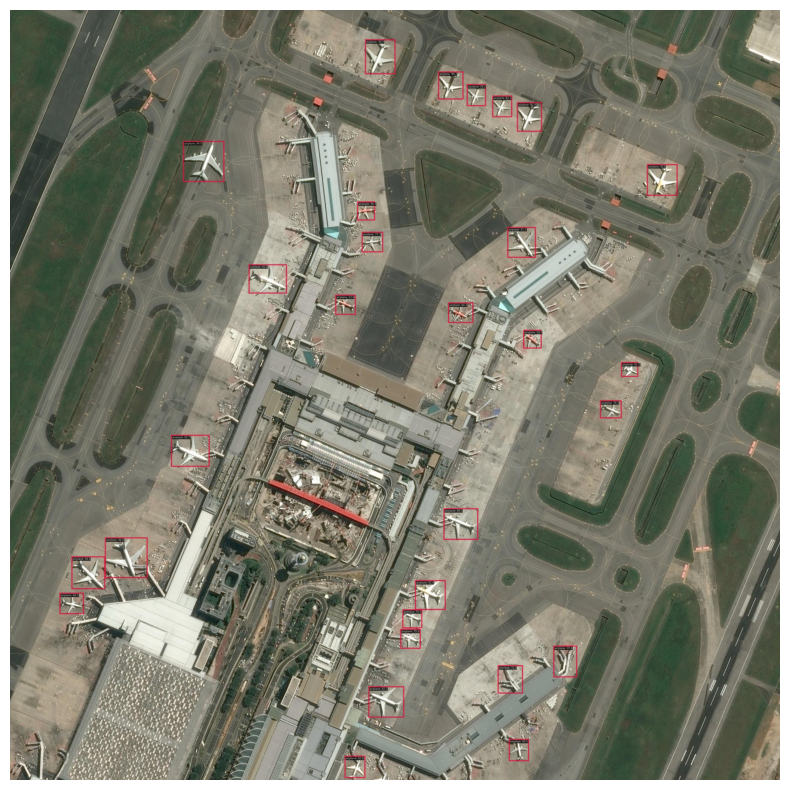

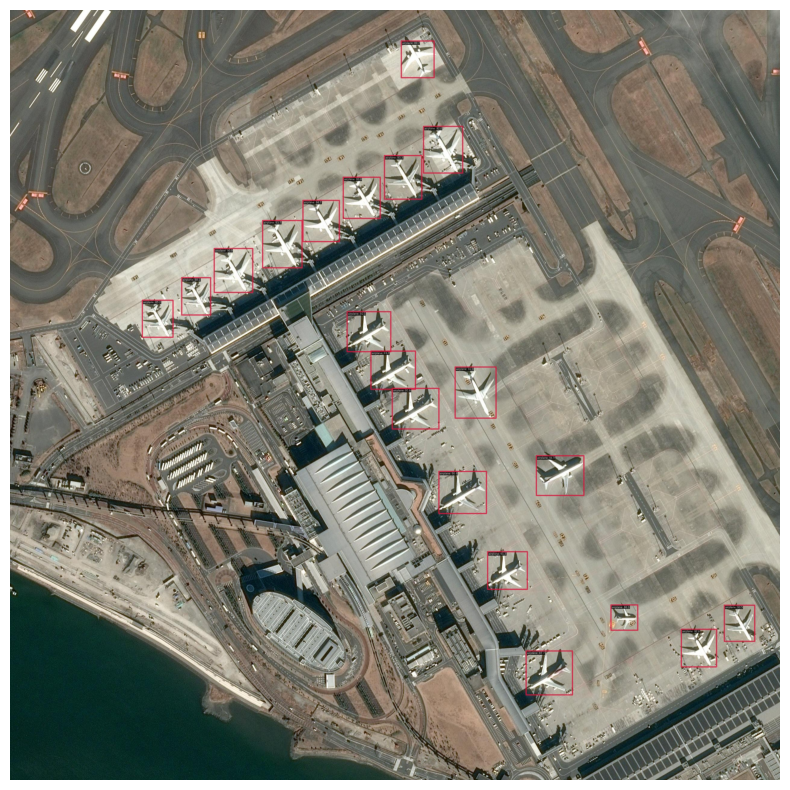

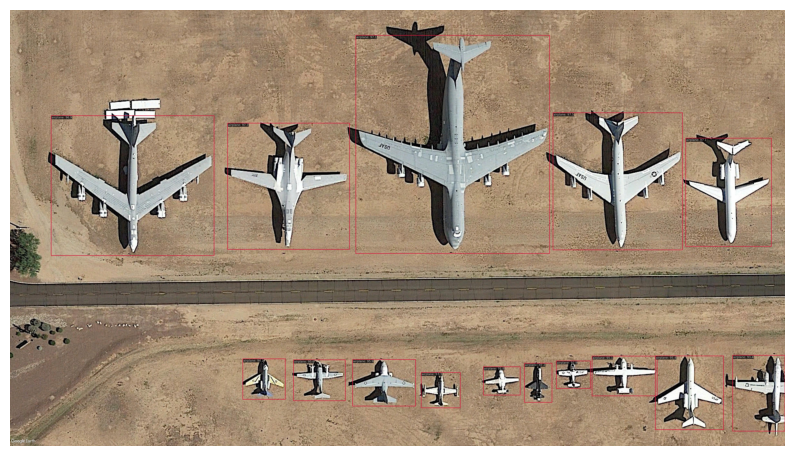

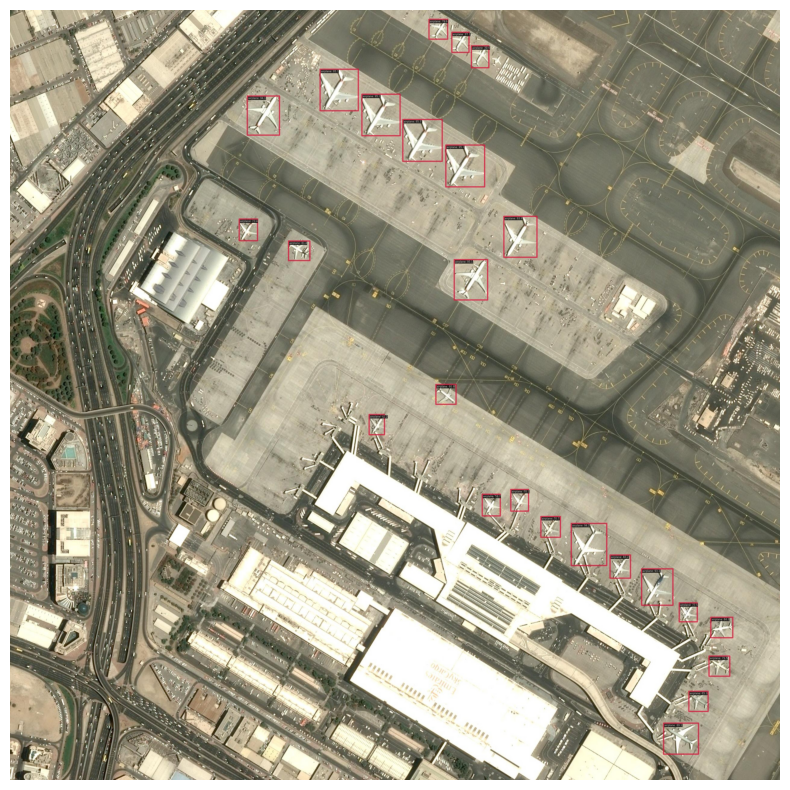

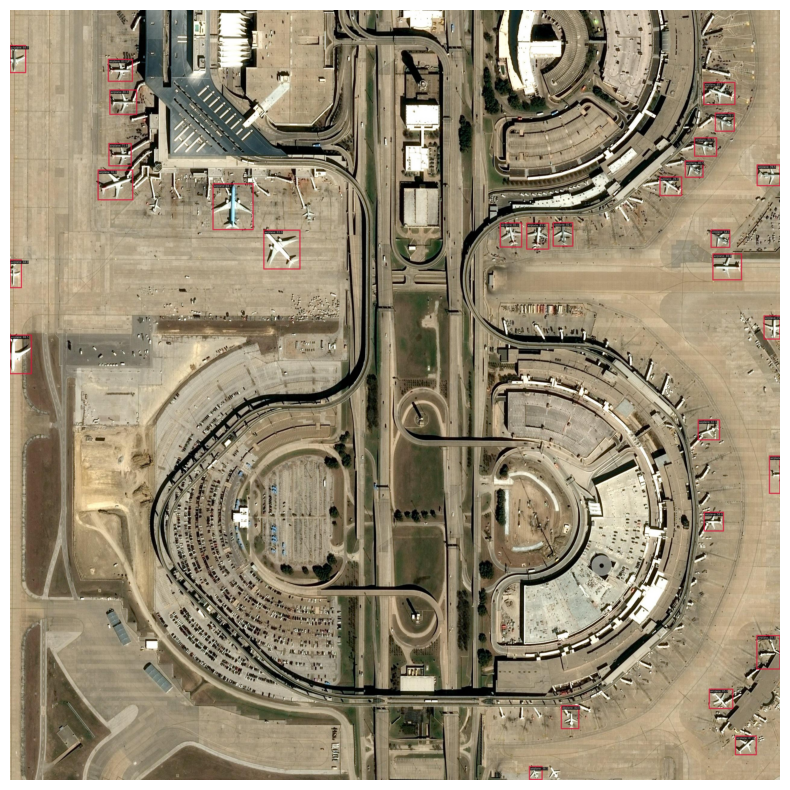

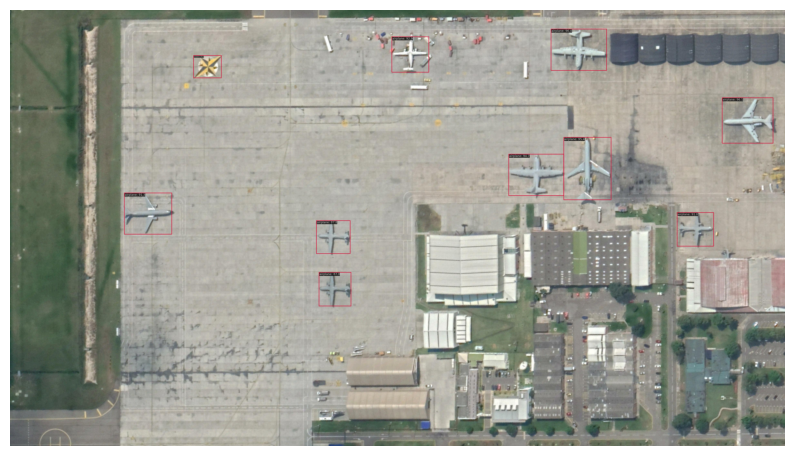

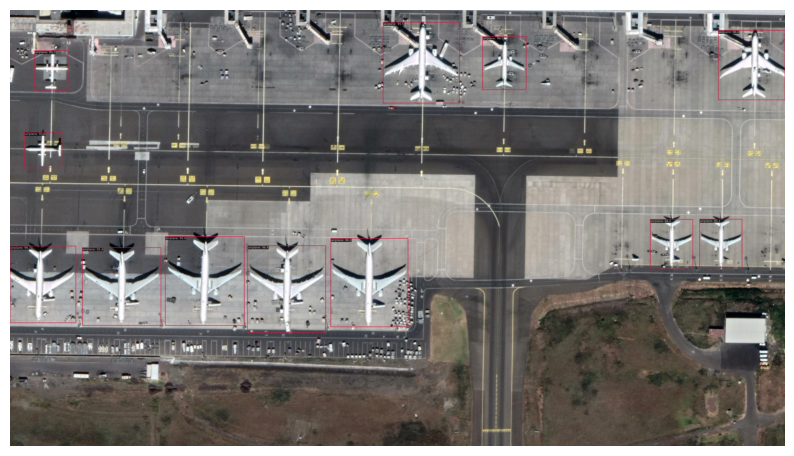

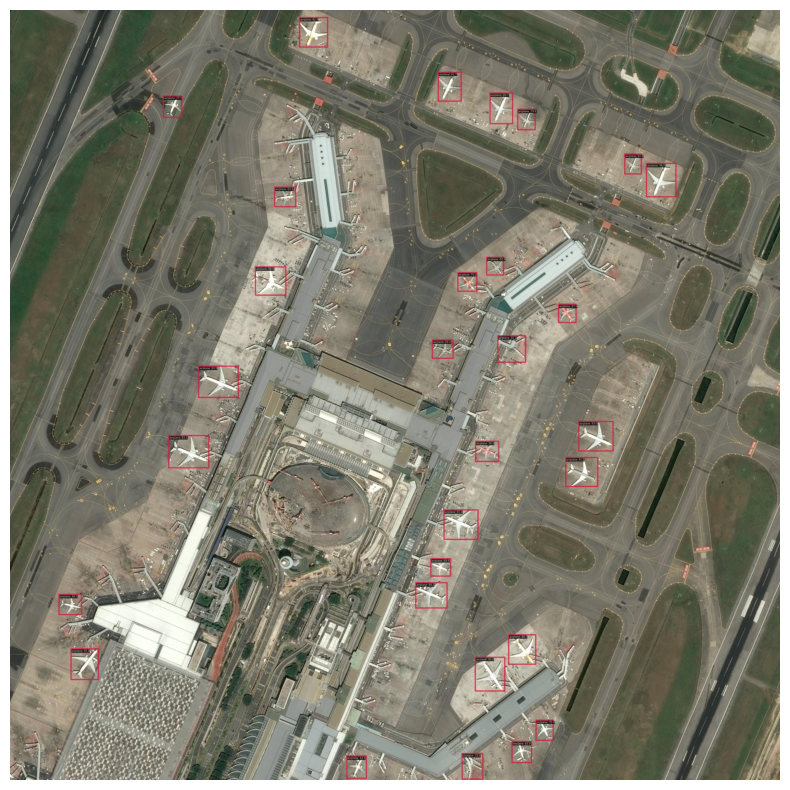

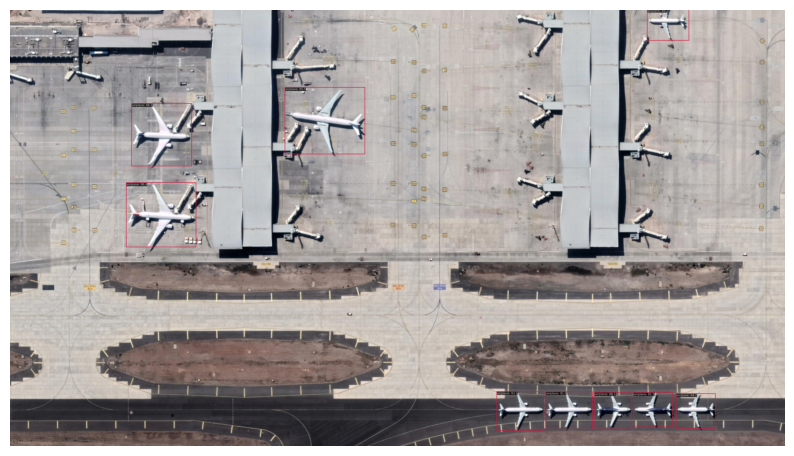

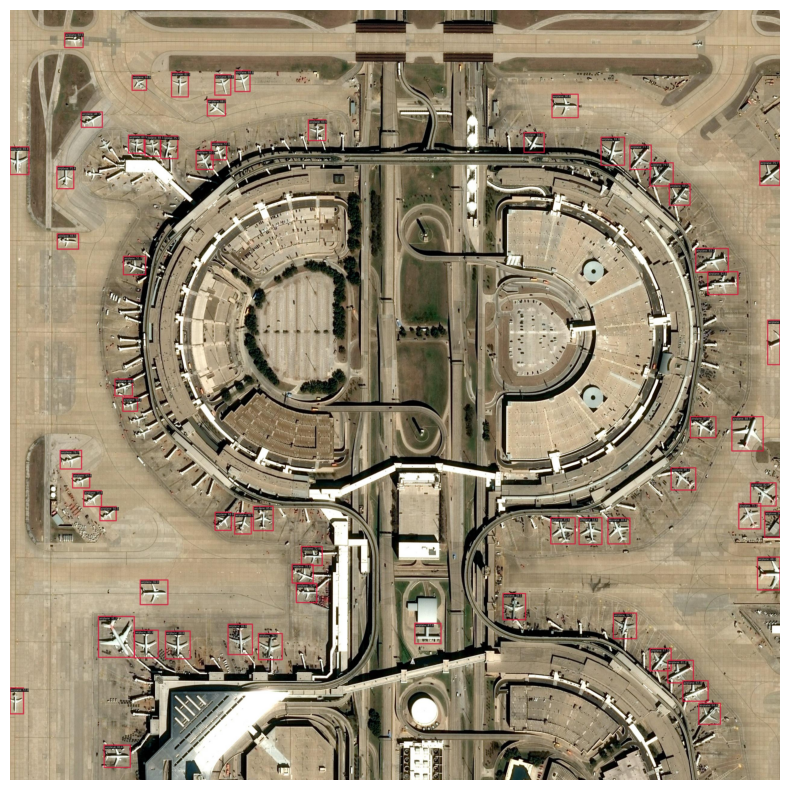

In [8]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Define the path to the directory containing the jpg images
path_to_images = './inference_test/results/rtmdet_inference/vis'

# Iterate over each file in the directory
for file in os.listdir(path_to_images):
    # Check if the file is a jpg image
    if file.endswith('.jpg'):
        # Open the image using PIL
        img = Image.open(os.path.join(path_to_images, file))

        # Convert the image to an RGB format that matplotlib can understand
        img_rgb = img.convert('RGB')

        # Display the image using matplotlib
        plt.figure(figsize=(10, 10))
        plt.imshow(img_rgb)
        plt.axis('off')
        plt.show()

### Inference Test on video

In [1]:
!python video_inference2.py inference_test/videos/Barcelona_airport.mp4 output_tensor/groundingdino/grounding_dino_hrplanesv2.py output_tensor/groundingdino/best.pth --texts airplane. --out inference_test/videos/Barcelona_airport_groundingDINO_inference.mp4 

/home/safouane/miniconda3/envs/openmmlab/lib/python3.8/site-packages/torchvision/datapoints/__init__.py:12: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. Please submit any feedback you may have in this issue: https://github.com/pytorch/vision/issues/6753, and you can also check out https://github.com/pytorch/vision/issues/7319 to learn more about the APIs that we suspect might involve future changes. You can silence this warning by calling torchvision.disable_beta_transforms_warning().
  warnings.warn(_BETA_TRANSFORMS_WARNING)
/home/safouane/miniconda3/envs/openmmlab/lib/python3.8/site-packages/torchvision/transforms/v2/__init__.py:54: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. Plea

In [4]:
import cv2
from mmengine.logging import print_log
from mmdet.apis import DetInferencer
from mmdet.evaluation import get_classes
import torchvision

# Suppress Beta Warnings
torchvision.disable_beta_transforms_warning()

def perform_video_inference(
    video_path,
    model_config=None,
    checkpoint=None,
    output_video_path="output.mp4",
    texts=None,
    device="cuda:0",
    score_thr=0.3,
    palette="none",
    show=False,
    wait_time=1,
):
    init_args = {
        "model": model_config,
        "weights": checkpoint,
        "device": device,
        "palette": palette,
        #"save_dir": "./visual_output",  # Ensure visual output directory
    }

    inferencer = DetInferencer(**init_args)

    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        raise ValueError(f"Unable to read video: {video_path}")

    fps = int(cap.get(cv2.CAP_PROP_FPS))
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    video_writer = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

    frame_count = 0
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    while True:
        ret, frame = cap.read()
        if not ret:
            break

        frame_count += 1
        print(f"Processing frame {frame_count}/{total_frames}...")

        try:
            result = inferencer(inputs=frame, pred_score_thr=score_thr, texts=texts)
            annotated_frame = inferencer.visualizer.get_image(result)
        except Exception as e:
            print(f"Error processing frame {frame_count}: {e}")
            annotated_frame = frame  # Use raw frame if inference fails

        if show:
            cv2.imshow("Inference", annotated_frame)
            if cv2.waitKey(int(wait_time * 1000)) & 0xFF == ord("q"):
                break

        video_writer.write(annotated_frame)

    cap.release()
    video_writer.release()
    if show:
        cv2.destroyAllWindows()

    print_log(f"Inference video saved at {output_video_path}")


# Example Usage
if __name__ == "__main__":
    perform_video_inference(
        video_path="inference_test/videos/Barcelona_airport.mp4",
        model_config="output_tensor/groundingdino/grounding_dino_hrplanesv2.py",
        checkpoint="output_tensor/groundingdino/best.pth",
        output_video_path="inference_test/videos/Barcelona_airport_groundingDINO_inference.mp4",
        texts="airplane .",
        device="cuda:0",
        score_thr=0.3,
        show=False,
    )


Loads checkpoint by local backend from path: output_tensor/groundingdino/best.pth


Output()

[nltk_data] Downloading package punkt to ~/nltk_data...

Processing frame 1/449...


[nltk_data]   Package punkt is already up-to-date!

: 

In [1]:
from mmdet.apis import DetInferencer

inferencer = DetInferencer(model='output_tensor/groundingdino/grounding_dino_hrplanesv2.py', weights='output_tensor/groundingdino/best.pth')

inferencer('inference_test/unseen/31_set1.jpg', show=True)

/home/safouane/miniconda3/envs/flightscope/lib/python3.8/site-packages/torchvision/datapoints/__init__.py:12: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. Please submit any feedback you may have in this issue: https://github.com/pytorch/vision/issues/6753, and you can also check out https://github.com/pytorch/vision/issues/7319 to learn more about the APIs that we suspect might involve future changes. You can silence this warning by calling torchvision.disable_beta_transforms_warning().
  warnings.warn(_BETA_TRANSFORMS_WARNING)
/home/safouane/miniconda3/envs/flightscope/lib/python3.8/site-packages/torchvision/transforms/v2/__init__.py:54: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. 

Loads checkpoint by local backend from path: output_tensor/groundingdino/best.pth
11/28 00:18:34 - mmengine - WARNING - Failed to search registry with scope "mmdet" in the "function" registry tree. As a workaround, the current "function" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmdet" is a correct scope, or whether the registry is initialized.
11/28 00:18:34 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.


Output()

AttributeError: 'DetDataSample' object has no attribute 'text'